# "Pride_Theory_in_Education"is focused on analyzing textual data from tweets, specifically examining how different aspects of language use correlate with social media engagement metrics such as retweets. We seek to understand how these topics are discussed, what sentiments are associated with them, and how the discussions evolve over time


# Loading The Data

In [2]:
import pandas as pd

# Load a CSV file into a DataFrame
df = pd.read_csv("C:/Users/User/Downloads/lgbtq_tweets (2).csv")
print(df)


                           Date             Username  \
0                          Date             Username   
1     2024-06-21 01:57:14+00:00            291755208   
2     2024-06-21 01:57:12+00:00  1772628647653818368   
3     2024-06-21 01:57:11+00:00  1718055069378080768   
4     2024-06-21 01:57:07+00:00           2685295766   
...                         ...                  ...   
1901  2024-06-21 02:29:10+00:00  1144616962422689797   
1902  2024-06-21 02:29:10+00:00  1779900838225625088   
1903  2024-06-21 02:29:09+00:00           2977692431   
1904  2024-06-21 02:29:09+00:00           2563777692   
1905  2024-06-21 02:29:09+00:00  1175193045408595969   

                                                  Tweet  
0                                                 tweet  
1     rt  i     la repblica dominicana le dice no al...  
2     rt  the same maga republicans denouncing pride...  
3     rt  orbn a ursula no hay suficiente dinero en ...  
4     rt  lego just released a lgbtq 

In [3]:
import pandas as pd

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/lgbtq_tweets (2).csv')

# Display the first few rows of the dataframe
print(data.head())

# Remove duplicate rows
data.drop_duplicates(inplace=True)

# Show the shape of the dataframe after removing duplicates
print(data.shape)



                        Date             Username  \
0                       Date             Username   
1  2024-06-21 01:57:14+00:00            291755208   
2  2024-06-21 01:57:12+00:00  1772628647653818368   
3  2024-06-21 01:57:11+00:00  1718055069378080768   
4  2024-06-21 01:57:07+00:00           2685295766   

                                               Tweet  
0                                              tweet  
1  rt  i     la repblica dominicana le dice no al...  
2  rt  the same maga republicans denouncing pride...  
3  rt  orbn a ursula no hay suficiente dinero en ...  
4  rt  lego just released a lgbtq pride video wit...  
(1573, 3)


In [4]:
import pandas as pd

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/lgbtq_tweets (2).csv')

# Print column names to verify the correct column for tweet texts
print("Column names in the dataset:", data.columns)


Column names in the dataset: Index(['Date', 'Username', 'Tweet'], dtype='object')


# Cleaning The Data

In [5]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/lgbtq_tweets (2).csv')

# Download necessary NLTK resources
nltk.download('stopwords')
nltk.download('punkt')

# Set of English stop words
stopwords = set(nltk.corpus.stopwords.words('english'))

# Adding additional stop words
additional_stopwords = {"dont", "rt"}  # 'dont' covers the non-apostrophe version without the apostrophe
stopwords.update(additional_stopwords)

# Function to clean text data
def clean_text(text):
    # Tokenize the text
    words = word_tokenize(text.lower())

    # Remove non-alphabetic characters and stop words
    words = [word for word in words if word.isalpha() and word not in stopwords]

    # Join the cleaned words back into a single string
    return ' '.join(words)

# Apply the cleaning function to the Tweet column
data['cleaned_text'] = data['Tweet'].apply(clean_text)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [9]:
# Remove duplicate rows based on the 'cleaned_text' column to ensure all entries are unique
unique_cleaned_tweets = data['cleaned_text'].drop_duplicates()

# Print the unique cleaned tweets
print(unique_cleaned_tweets)

# Save the unique cleaned tweets to a new CSV file
unique_cleaned_tweets.to_csv('C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv', index=False)

print("Unique tweets have been saved to 'unique_lgbtq_tweets.csv'.")


0                                                   tweet
1       la repblica dominicana le dice al turismo gay ...
2       maga republicans denouncing pride month donni ...
3       orbn ursula hay suficiente dinero en el mundo ...
4       lego released lgbtq pride video furries drag q...
                              ...                        
1901    pov yo trans girl big cock riding till cum wou...
1902    casi atraviesa con esa vergota morena delicios...
1903    seems everyone allow mock parody otherwise mak...
1904                                    thick trans girls
1905                good morning min raw hot uncut fuckin
Name: cleaned_text, Length: 843, dtype: object
Unique tweets have been saved to 'unique_lgbtq_tweets.csv'.


# Remove Stopwords

In [10]:
import regex as re
import nltk
from nltk.corpus import stopwords

# Ensure nltk stopwords are loaded
nltk.download('stopwords')
stopwords_set = set(stopwords.words('english'))

# Adding custom stopwords
stopwords_set.update({"dont", "rt"})

def tokenize(text):
    """Tokenize the text using regex to capture words and hyphenated words."""
    return re.findall(r'[\w-]*[a-z|A-Z][\w-]*', text)

def remove_stop(tokens):
    """Remove stopwords from the list of tokens."""
    return [t for t in tokens if t.lower() not in stopwords_set]

pipeline = [str.lower, tokenize, remove_stop]

def prepare(text, pipeline):
    """Apply a series of functions defined in the pipeline to preprocess the text."""
    tokens = text
    for function in pipeline:
        tokens = function(tokens)
    return tokens

# Apply the preprocessing pipeline to the 'Tweet' column and store the result in a new column
data['tokens'] = data['Tweet'].apply(prepare, args=(pipeline,))

# Show the first few rows of the dataframe to verify the results
print(data[['Tweet', 'tokens']].head())


                                               Tweet  \
0                                              tweet   
1  rt  i     la repblica dominicana le dice no al...   
2  rt  the same maga republicans denouncing pride...   
3  rt  orbn a ursula no hay suficiente dinero en ...   
4  rt  lego just released a lgbtq pride video wit...   

                                              tokens  
0                                            [tweet]  
1  [la, repblica, dominicana, le, dice, al, turis...  
2  [maga, republicans, denouncing, pride, month, ...  
3  [orbn, ursula, hay, suficiente, dinero, en, el...  
4  [lego, released, lgbtq, pride, video, furries,...  


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [11]:
import pandas as pd
from collections import Counter

# Assuming 'data' is your DataFrame that contains the 'tokens' column
counter = Counter()

# Update the counter with all tokens
data['tokens'].map(counter.update)

# Convert the counter to a DataFrame
freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])

# Filter to include only items with frequency >= 1
freq_df = freq_df.query('freq >= 1')

# Name the index as 'token'
freq_df.index.name = 'token'

# Sort the DataFrame by frequency in descending order
freq_df = freq_df.sort_values('freq', ascending=False)

# Display the top 10 frequent tokens
freq_df.head(10)


,freq
token,
school,428
pride,382
education,325
gender,313
lgbtq,265
amp,255
ideology,232
clubs,160
place,153


# Identifying most frequently occuring tokens.

In [14]:
pip install numpy pandas

Note: you may need to restart the kernel to use updated packages.


In [16]:
import numpy as np
import pandas as pd

def compute_idf(df, column='tokens', preprocess=None, min_df=1):
    def update(doc):
        # Use the preprocess function if provided, otherwise use tokens directly
        tokens = doc if preprocess is None else preprocess(doc)
        # Update counter with unique tokens in the document
        counter.update(set(tokens))

    # Initialize a counter to keep document frequencies
    counter = Counter()
    df[column].map(update)

    # Create a DataFrame from the counter
    idf_df = pd.DataFrame.from_dict(counter, orient='index', columns=['df'])

    # Filter rows by minimum document frequency
    idf_df = idf_df.query('df >= @min_df')

    # Compute IDF values
    idf_df['idf'] = np.log((len(df) / idf_df['df'])) + 0.1

    # Set the index name to 'token'
    idf_df.index.name = 'token'

    return idf_df

# Assuming 'data' is your DataFrame that contains the 'tokens' column with token lists
idf_df = compute_idf(data)




In [17]:
freq_df['tfidf'] = freq_df['freq'] * idf_df['idf']
freq_df.head()

,freq,tfidf
token,,
school,428,732.988876
pride,382,668.549183
education,325,617.561570
gender,313,613.176373
lgbtq,265,555.422516


# Computed Idf values for token to identify the significance of the words accross words.

# Computes average sentiment scores grouped by retweet counts, and visualizes the relationship between retweets and sentiment scores with a scatter plot

                                         cleaned_text  textblob_sentiment  \
0                                               tweet            0.000000   
1   la repblica dominicana le dice al turismo gay ...            0.416667   
2   maga republicans denouncing pride month donni ...            0.000000   
3   orbn ursula hay suficiente dinero en el mundo ...            0.000000   
4   lego released lgbtq pride video furries drag q...           -0.100000   
5                                               lgbtq            0.000000   
6   duro golpe la ideologa de gnero el gobierno de...            0.000000   
7      atampt altria comcast cvs charter unitedhealth            0.000000   
8   antitrans doctor accused stealing patient info...            0.000000   
9                    lgbtq lets get bag tonight queen            0.000000   
10  dc pride parade promoted support lgbtq communi...           -0.250000   
11  honored meet prince reza pahlavi discuss futur...            0.000000   

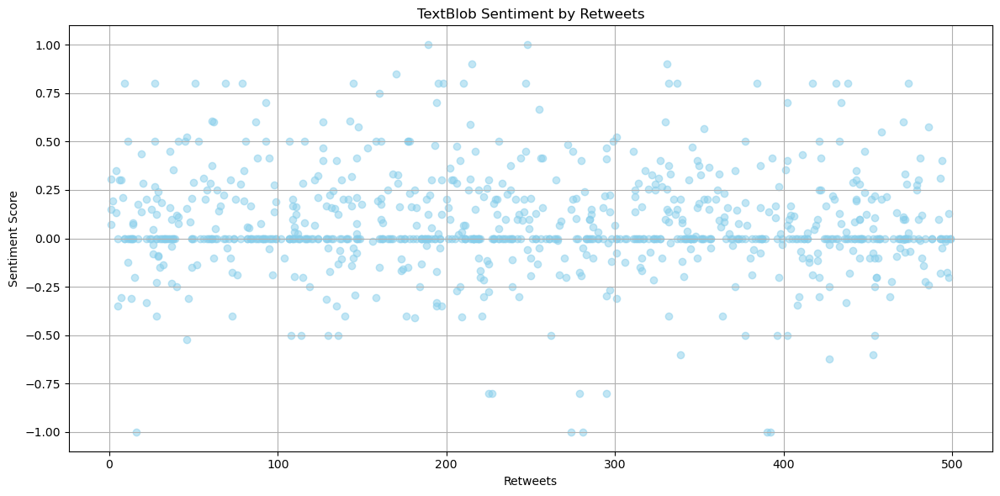

In [20]:
import pandas as pd
from textblob import TextBlob
import matplotlib.pyplot as plt
import numpy as np


# Load the dataset
file_path = "C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv"
df = pd.read_csv(file_path)

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# TextBlob Sentiment Analysis
df['textblob_sentiment'] = df['cleaned_text'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Add example engagement columns for demonstration if not present
if 'retweets' not in df.columns:
    df['retweets'] = np.random.randint(1, 500, size=len(df))

# Print the DataFrame with all sentiment scores and retweet counts
print(df[['cleaned_text', 'textblob_sentiment', 'retweets']].head(20))

# Calculate average sentiment scores grouped by retweet counts
avg_textblob_sentiment_by_retweets = df.groupby('retweets')['textblob_sentiment'].mean()
print(f"\nAverage TextBlob Sentiment by Retweets:\n", avg_textblob_sentiment_by_retweets.head())

# Plotting sentiment scores by retweets
plt.figure(figsize=(12, 6))

# Scatter plot of TextBlob sentiment by retweets
plt.scatter(df['retweets'], df['textblob_sentiment'], alpha=0.5, color='skyblue')
plt.title('TextBlob Sentiment by Retweets')
plt.xlabel('Retweets')
plt.ylabel('Sentiment Score')
plt.grid(True)

plt.tight_layout()
plt.show()

# Optional: Save the DataFrame with sentiment scores and engagement metrics to a new CSV file
df.to_csv('unique_lgbtq_tweets_with_textblob_sentiment_and_engagement.csv', index=False)


#  calculating the average sentiment, and visualizes the sentiment distribution and individual sentiment scores with a histogram and scatter plot

Average Sentiment: 0.07263312606258718


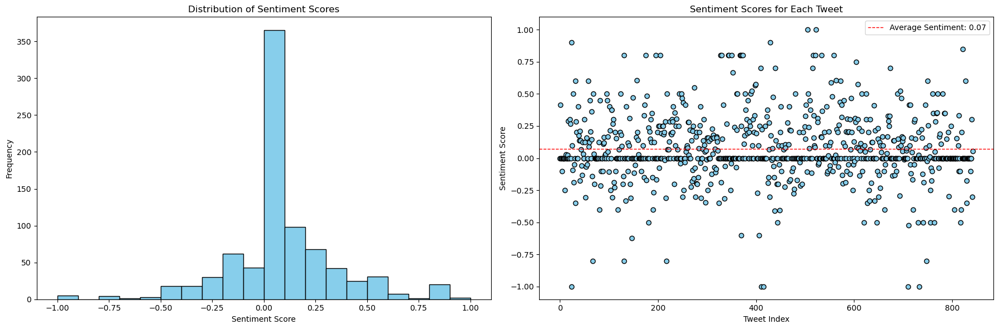

In [22]:
import pandas as pd
from textblob import TextBlob
import matplotlib.pyplot as plt
# Load the dataset
file_path = "C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv"
df = pd.read_csv(file_path)

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Perform sentiment analysis on the cleaned text
df['sentiment'] = df['cleaned_text'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Calculate the average sentiment
average_sentiment = df['sentiment'].mean()
print(f"Average Sentiment: {average_sentiment}")

# Plotting
plt.figure(figsize=(18, 6))

# Histogram of sentiment scores
plt.subplot(1, 2, 1)
plt.hist(df['sentiment'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

# Scatter plot of sentiment scores for each tweet
plt.subplot(1, 2, 2)
plt.scatter(range(len(df)), df['sentiment'], color='skyblue', edgecolor='black')
plt.title('Sentiment Scores for Each Tweet')
plt.xlabel('Tweet Index')
plt.ylabel('Sentiment Score')
plt.axhline(average_sentiment, color='red', linestyle='dashed', linewidth=1, label=f'Average Sentiment: {average_sentiment:.2f}')
plt.legend()

plt.tight_layout()
plt.show()

# extracts and counts bigrams (pairs of consecutive words).

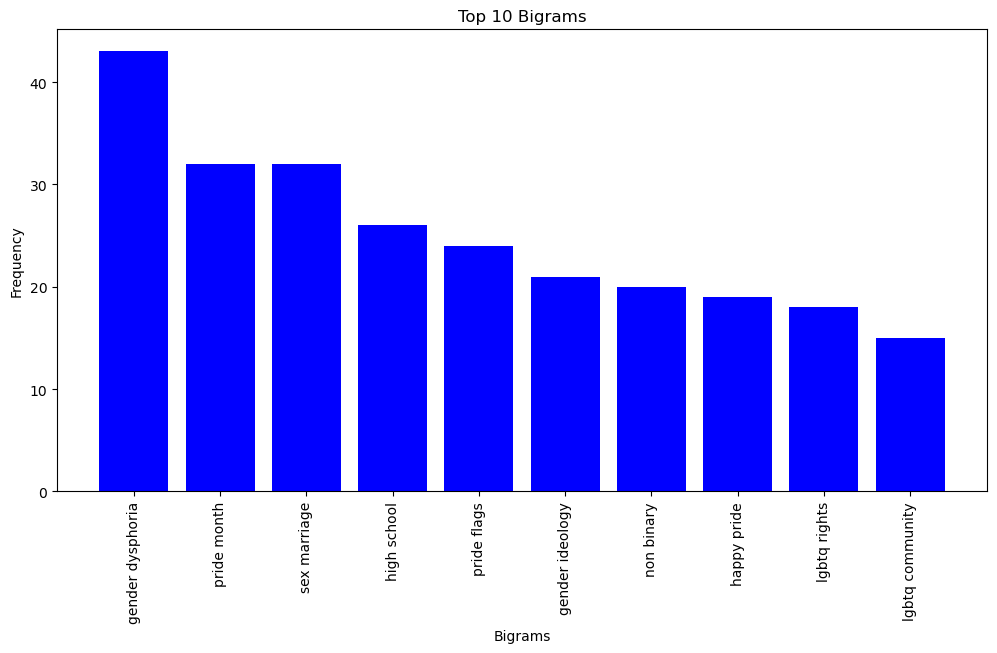

In [23]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.util import ngrams
from collections import Counter
import matplotlib.pyplot as plt

# Load the dataset
file_path = "C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv"
df = pd.read_csv(file_path)

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Define stopwords and a function to preprocess text
stop_words = set(stopwords.words('english'))

def preprocess(text):
    tokens = word_tokenize(text)
    tokens = [token.lower() for token in tokens if token.isalpha() and token.lower() not in stop_words]
    return tokens

# Apply preprocessing and extract bigrams
df['tokens'] = df['cleaned_text'].apply(preprocess)
df['bigrams'] = df['tokens'].apply(lambda tokens: list(ngrams(tokens, 2)))

# Flatten the list of bigrams and count their frequencies
all_bigrams = [bigram for sublist in df['bigrams'] for bigram in sublist]
bigram_counts = Counter(all_bigrams)

# Get the top 10 most common bigrams
top_10_bigrams = bigram_counts.most_common(10)
top_10_bigrams_words = [' '.join(bigram) for bigram, count in top_10_bigrams]
top_10_bigrams_counts = [count for bigram, count in top_10_bigrams]

# Plot the top 10 bigrams
plt.figure(figsize=(12, 6))
plt.bar(top_10_bigrams_words, top_10_bigrams_counts, color='blue')
plt.xticks(rotation=90)
plt.title('Top 10 Bigrams')
plt.xlabel('Bigrams')
plt.ylabel('Frequency')
plt.show()


# sentiment polarity for tweets containing specific topics using TextBlob, and then visualizes the average sentiment polarity for each topic with a horizontal bar chart. It helps identify how positively or negatively each topic is perceived in the dataset.








Sentiment Analysis Results by Topic:
Topic 'celebration' - Average Sentiment Polarity: 0.28125
Topic 'pride' - Average Sentiment Polarity: 0.1342796317096835
Topic 'equality' - Average Sentiment Polarity: 0.11224747474747475
Topic 'lgbtq' - Average Sentiment Polarity: 0.09746668501517636
Topic 'community' - Average Sentiment Polarity: 0.07798151718073591
Topic 'support' - Average Sentiment Polarity: 0.07656396018003161
Topic 'rights' - Average Sentiment Polarity: 0.045867072742072725
Topic 'gender' - Average Sentiment Polarity: 0.01183930214597916


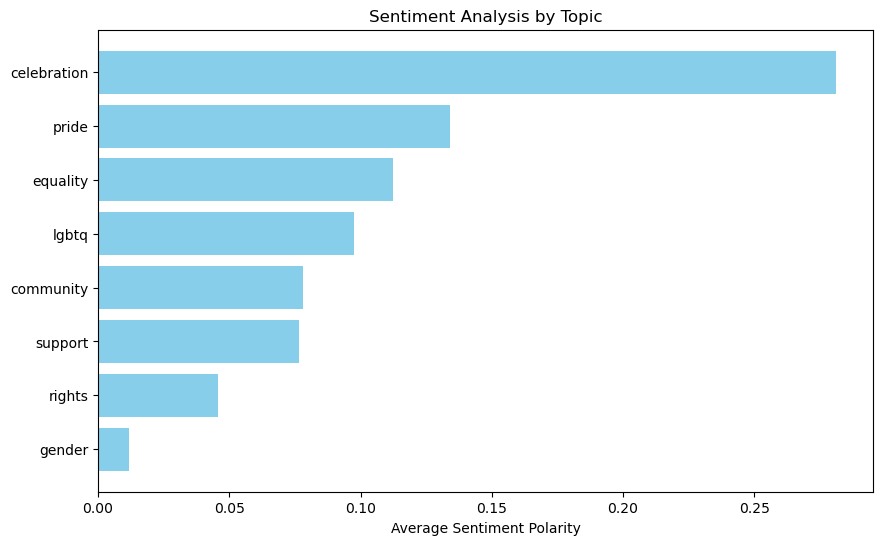

In [24]:
import pandas as pd
from textblob import TextBlob
import matplotlib.pyplot as plt

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Define topics of interest (example topics, adjust as needed)
post_keywords = ['pride', 'community', 'lgbtq', 'gender', 'equality', 'rights', 'support', 'celebration']

# Function to analyze sentiment polarity
def analyze_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Dictionary to store sentiment scores for each topic
topic_sentiments = {topic: [] for topic in post_keywords}

# Analyzing sentiment for tweets containing each topic
for text in df['cleaned_text']:
    for topic in post_keywords:
        if topic.lower() in text.lower():
            sentiment_score = analyze_sentiment(text)
            topic_sentiments[topic].append(sentiment_score)

# Calculate average sentiment polarity for each topic
average_sentiments = {topic: sum(scores) / len(scores) if scores else 0 for topic, scores in topic_sentiments.items()}

# Sort topics by average sentiment polarity
sorted_topics = sorted(average_sentiments.items(), key=lambda x: x[1], reverse=True)

# Print sentiment analysis results by topic
print("Sentiment Analysis Results by Topic:")
for topic, avg_sentiment in sorted_topics:
    print(f"Topic '{topic}' - Average Sentiment Polarity: {avg_sentiment}")

# Plotting the sentiment analysis results
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_topics)), [sentiment for topic, sentiment in sorted_topics], align='center', color='skyblue')
plt.yticks(range(len(sorted_topics)), [topic for topic, sentiment in sorted_topics])
plt.xlabel('Average Sentiment Polarity')
plt.title('Sentiment Analysis by Topic')
plt.gca().invert_yaxis()  # Invert y-axis to display the topic with the highest sentiment at the top
plt.show()

 # average sentiment polarity and tweet count grouped by retweet count, and visualizes the relationship with a scatter plot and regression line.

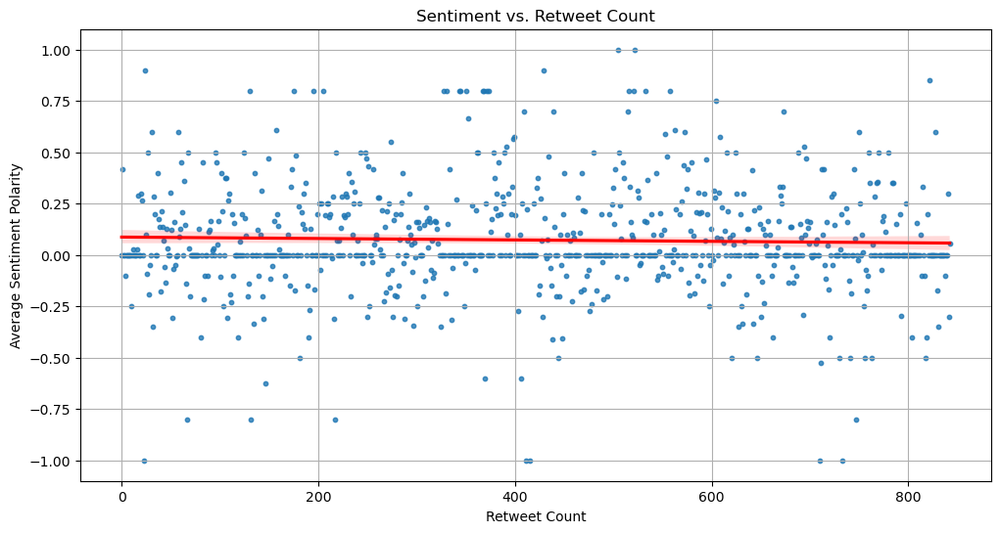

In [25]:
import pandas as pd
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Ensure retweet_count column exists or create a synthetic one for demonstration
if 'retweet_count' not in df.columns:
    df['retweet_count'] = pd.Series([int(x) for x in range(len(df))])

# Function to analyze sentiment polarity
def analyze_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Perform sentiment analysis on the cleaned text
df['sentiment'] = df['cleaned_text'].apply(analyze_sentiment)

# Group by retweet count and calculate average sentiment and count of tweets
retweet_sentiment = df.groupby('retweet_count').agg({'sentiment': 'mean', 'cleaned_text': 'count'}).reset_index()
retweet_sentiment.rename(columns={'cleaned_text': 'tweet_count'}, inplace=True)

# Plotting
plt.figure(figsize=(12, 6))

# Scatter plot with regression line
sns.regplot(x='retweet_count', y='sentiment', data=retweet_sentiment, scatter_kws={'s':10}, line_kws={'color':'red'})
plt.title('Sentiment vs. Retweet Count')
plt.xlabel('Retweet Count')
plt.ylabel('Average Sentiment Polarity')
plt.grid(True)
plt.show()


# visualize the relationship between retweet count and sentiment polarity over time

In [26]:
import pandas as pd
from textblob import TextBlob
import numpy as np
import plotly.express as px
import plotly.graph_objs as go

# Load the dataset
file_path = "C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv"
df = pd.read_csv(file_path)

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Ensure retweet_count column exists or create a synthetic one for demonstration
if 'retweet_count' not in df.columns:
    df['retweet_count'] = np.random.randint(1, 500, size=len(df))

# Function to analyze sentiment polarity
def analyze_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Perform sentiment analysis on the cleaned text
df['sentiment'] = df['cleaned_text'].apply(analyze_sentiment)

# Create a synthetic Date column for demonstration
df['Date'] = pd.date_range(start='2023-01-01', periods=len(df))

# Plotting animated scatter plot
fig = px.scatter(df, x='retweet_count', y='sentiment',
                 size='retweet_count', color='sentiment',
                 hover_name='cleaned_text', animation_frame='Date',
                 range_x=[0, 500], range_y=[-1, 1],
                 labels={'retweet_count': 'Retweet Count', 'sentiment': 'Sentiment Polarity'},
                 title='Sentiment vs. Retweet Count Over Time')

# Customize the layout
fig.update_layout(title='Sentiment vs. Retweet Count Over Time',
                  xaxis_title='Retweet Count',
                  yaxis_title='Sentiment Polarity',
                  template='plotly_dark')

# Show the plot
fig.show()

In [27]:
import pandas as pd
from textblob import TextBlob
import numpy as np
import plotly.graph_objects as go

# Load the dataset
file_path = "C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv"
df = pd.read_csv(file_path)

# Ensure all entries in 'cleaned_text' are strings and handle missing values
df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')

# Ensure retweet_count column exists or create a synthetic one for demonstration
if 'retweet_count' not in df.columns:
    df['retweet_count'] = np.random.randint(1, 500, size=len(df))

# Function to analyze sentiment polarity
def analyze_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Perform sentiment analysis on the cleaned text
df['sentiment'] = df['cleaned_text'].apply(analyze_sentiment)

# Assuming the dataset contains 'latitude' and 'longitude' columns
# For demonstration, we'll create synthetic latitude and longitude data
if 'latitude' not in df.columns or 'longitude' not in df.columns:
    np.random.seed(0)
    df['latitude'] = np.random.uniform(-90, 90, len(df))
    df['longitude'] = np.random.uniform(-180, 180, len(df))

# Prepare the data for plotting
fig = go.Figure()

# Add traces for each sentiment score
fig.add_trace(go.Scattergeo(
    lon = df['longitude'],
    lat = df['latitude'],
    text = df['cleaned_text'],
    marker = dict(
        size = df['retweet_count'] / 10,  # Adjust the size of the markers
        color = df['sentiment'],
        colorscale = 'RdYlGn',
        colorbar_title = "Sentiment",
        line_width=0.5,
        sizemode = 'area'
    ),
    hoverinfo = 'text'
))

# Configure the layout for the globe
fig.update_geos(
    visible=False,
    resolution=50,
    showland=True, landcolor="rgb(217, 217, 217)",
    showcountries=True, countrycolor="rgb(204, 204, 204)",
    showocean=True, oceancolor="rgb(128, 205, 255)",
    showlakes=True, lakecolor="rgb(255, 255, 255)",
    showrivers=True, rivercolor="rgb(255, 255, 255)"
)

fig.update_layout(
    title='3D Scatter Plot of Sentiment Scores by Location',
    showlegend=False,
    geo=dict(
        projection=dict(
            type='orthographic',
            rotation=dict(
                lon=-100,
                lat=40,
                roll=0
            ),
            scale=0.8
        ),
        lonaxis=dict(
            showgrid=True,
            gridcolor="rgb(102, 102, 102)"
        ),
        lataxis=dict(
            showgrid=True,
            gridcolor="rgb(102, 102, 102)"
        )
    ),
    template='plotly_dark'
)

# Show the plot
fig.show()



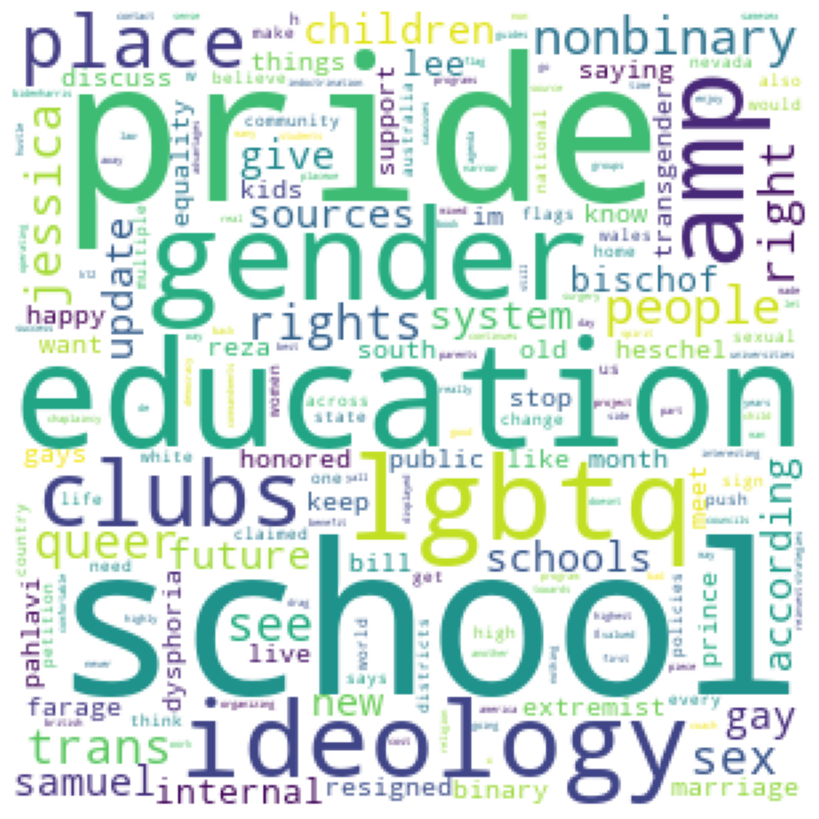

In [28]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt
wc = WordCloud(background_color='white', width = 300, height=300, margin=2)
wc.fit_words(freq_df['freq'].to_dict() )
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wc)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

# term frequency-inverse document frequency (tf-idf) values instead of simple token frequencies, which gives more importance to unique words in the dataset.

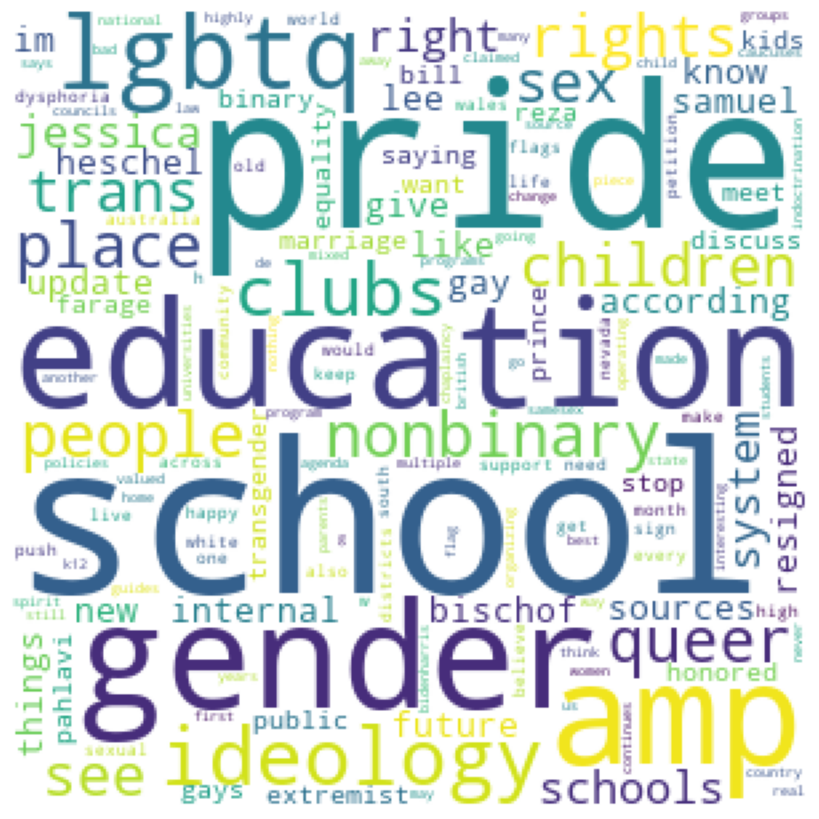

In [29]:
wc = WordCloud(background_color='white', width = 300, height=300, margin=2)
wc.fit_words(freq_df['tfidf'].to_dict() )
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wc)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [30]:
# Install the necessary package
!pip install nltk

# Import necessary libraries
import nltk
from nltk.corpus import opinion_lexicon
from nltk.tokenize import treebank

# Download the opinion lexicon and tokenizer
nltk.download('opinion_lexicon')
nltk.download('punkt')

# Function to perform sentiment analysis
def analyze_sentiment(text):
    tokenizer = treebank.TreebankWordTokenizer()
    tokens = tokenizer.tokenize(text)

    positive_words = set(opinion_lexicon.positive())
    negative_words = set(opinion_lexicon.negative())

    pos_count = sum(1 for word in tokens if word in positive_words)
    neg_count = sum(1 for word in tokens if word in negative_words)

    if pos_count > neg_count:
        return 'Positive'
    elif neg_count > pos_count:
        return 'Negative'
    else:
        return 'Neutral'

# Example usage
example_text = "I love being part of the LGBTQ community but sometimes it's challenging."
sentiment = analyze_sentiment(example_text)
print('Sentiment:', sentiment)

# Show some information about the lexicon
print('Total number of words in opinion lexicon:', len(opinion_lexicon.words()))
print('Examples of positive words in opinion lexicon:', list(opinion_lexicon.positive())[:10])
print('Examples of negative words in opinion lexicon:', list(opinion_lexicon.negative())[:10])


Sentiment: Neutral
Total number of words in opinion lexicon: 6789
Examples of positive words in opinion lexicon: ['a+', 'abound', 'abounds', 'abundance', 'abundant', 'accessable', 'accessible', 'acclaim', 'acclaimed', 'acclamation']
Examples of negative words in opinion lexicon: ['2-faced', '2-faces', 'abnormal', 'abolish', 'abominable', 'abominably', 'abominate', 'abomination', 'abort', 'aborted']


[nltk_data] Downloading package opinion_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package opinion_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [31]:


# Initialize the dictionary for word scoring
word_dict = {}

# Assign a positive score to each positive word
pos_score = 1
for word in opinion_lexicon.positive():
    word_dict[word] = pos_score

# Assign a negative score to each negative word
neg_score = -1
for word in opinion_lexicon.negative():
    word_dict[word] = neg_score

# Output some examples from the dictionary
print("Sample entries from the dictionary:")
list(word_dict.items())[:10]  # Show the first 10 entries


Sample entries from the dictionary:


[('a+', 1),
 ('abound', 1),
 ('abounds', 1),
 ('abundance', 1),
 ('abundant', 1),
 ('accessable', 1),
 ('accessible', 1),
 ('acclaim', 1),
 ('acclaimed', 1),
 ('acclamation', 1)]

In [32]:
def bing_liu_score(text):
    sentiment_score = 0
    bag_of_words = word_tokenize(text.lower())
    for word in bag_of_words:
        if word in word_dict:
            sentiment_score += word_dict[word]
    return sentiment_score

In [33]:
import pandas as pd

# Define positive and negative word lists related to the LGBTQ+ community
positive_words = ['supportive', 'accepted', 'equality', 'pride', 'inclusive', 'love', 'celebration', 'community', 'rights', 'ally']
negative_words = ['discrimination', 'hate', 'homophobic', 'transphobic', 'prejudice', 'exclusion', 'bullying', 'stigma', 'inequality', 'harassment']

# Function to analyze sentiment using simple word matching
def simple_sentiment_analysis(text):
    if not isinstance(text, str):
        text = ''
    text = text.lower()
    pos_count = sum(text.count(word) for word in positive_words)
    neg_count = sum(text.count(word) for word in negative_words)

    if pos_count > neg_count:
        return 'Positive'
    elif neg_count > pos_count:
        return 'Negative'
    else:
        return 'Neutral'

# Assuming 'data' is your DataFrame and 'cleaned_text' is the column with preprocessed text
# Apply the sentiment analysis function to the cleaned_text column
data['sentiment'] = data['cleaned_text'].apply(simple_sentiment_analysis)

# Display the results
print(data.head())


                        Date             Username  \
0                       Date             Username   
1  2024-06-21 01:57:14+00:00            291755208   
2  2024-06-21 01:57:12+00:00  1772628647653818368   
3  2024-06-21 01:57:11+00:00  1718055069378080768   
4  2024-06-21 01:57:07+00:00           2685295766   

                                               Tweet  \
0                                              tweet   
1  rt  i     la repblica dominicana le dice no al...   
2  rt  the same maga republicans denouncing pride...   
3  rt  orbn a ursula no hay suficiente dinero en ...   
4  rt  lego just released a lgbtq pride video wit...   

                                        cleaned_text  \
0                                              tweet   
1  la repblica dominicana le dice al turismo gay ...   
2  maga republicans denouncing pride month donni ...   
3  orbn ursula hay suficiente dinero en el mundo ...   
4  lego released lgbtq pride video furries drag q...   

       

In [34]:
pip install nltk pandas


Note: you may need to restart the kernel to use updated packages.


In [35]:
import nltk
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


                                        cleaned_text sentiment
0                                              tweet   Neutral
1  la repblica dominicana le dice al turismo gay ...   Neutral
2  maga republicans denouncing pride month donni ...   Neutral
3  orbn ursula hay suficiente dinero en el mundo ...   Neutral
4  lego released lgbtq pride video furries drag q...  Positive


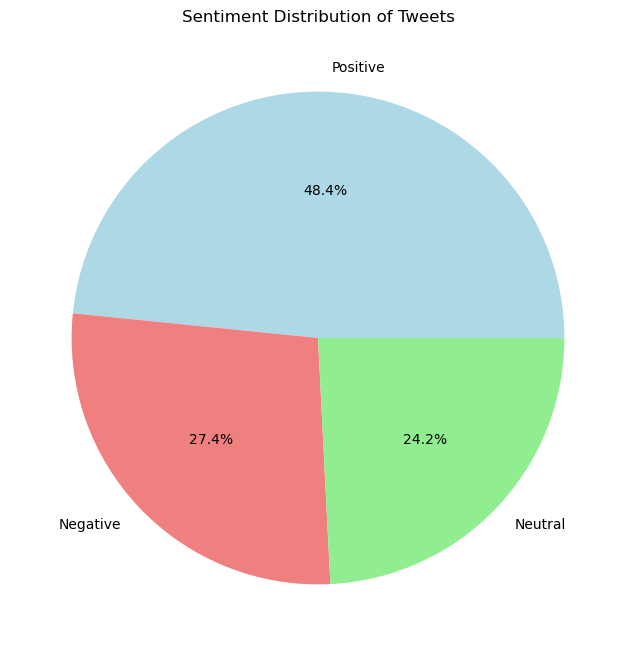

In [37]:
import pandas as pd
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk

# Ensure VADER is available
nltk.download('vader_lexicon')

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Function to analyze sentiment using VADER
def vader_sentiment(text):
    if not isinstance(text, str):
        text = ''
    scores = sid.polarity_scores(text)
    if scores['compound'] >= 0.05:
        return 'Positive'
    elif scores['compound'] <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply sentiment analysis to each tweet
data['sentiment'] = data['cleaned_text'].apply(vader_sentiment)

# Save or display the results
data.to_csv('vader_sentiment_analysis_results.csv', index=False)
print(data.head())

# Plot the sentiment distribution
import matplotlib.pyplot as plt

# Calculate the distribution of sentiments
sentiment_distribution = data['sentiment'].value_counts()

# Plot the sentiment distribution as a pie chart
plt.figure(figsize=(8, 8))
sentiment_distribution.plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Sentiment Distribution of Tweets')
plt.ylabel('')  # Hide the y-label for a cleaner look
plt.show()


# Latent Dirichlet Allocation (LDA) to extract and display 10 topics with their top words.

In [38]:
import pandas as pd
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# Ensure necessary NLTK resources are available
nltk.download('stopwords')

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv')

# Preprocess the text data
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess(text):
    # Remove non-alphabetic characters and convert to lowercase
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    # Tokenize
    tokens = text.split()
    # Remove stop words and apply stemming
    tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(tokens)

data['cleaned_text'] = data['cleaned_text'].apply(lambda x: preprocess(str(x)))

# Check the size of the DataFrame
print(f"DataFrame size: {data.shape[0]} rows")

# Print text for valid indices
if data.shape[0] > 2666:
    print(repr(data.iloc[2666]["cleaned_text"][0:400]))
else:
    print("Index 2666 is out of bounds")

if data.shape[0] > 4726:
    print(repr(data.iloc[4726]["cleaned_text"][0:400]))
else:
    print("Index 4726 is out of bounds")

# Create a document-term matrix
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = vectorizer.fit_transform(data['cleaned_text'])

# Apply LDA with 10 topics
lda = LatentDirichletAllocation(n_components=10, random_state=0)
lda.fit(dtm)

# Display the topics and their associated words
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
display_topics(lda, vectorizer.get_feature_names_out(), no_top_words)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


DataFrame size: 843 rows
Index 2666 is out of bounds
Index 4726 is out of bounds
Topic 1:
gay pride like school peopl educ kid queer amp make
Topic 2:
marriag nonbinari pride amp sex club countri vote thailand lgbtq
Topic 3:
tran queer lgbtq peopl club binari like right commun mean
Topic 4:
que school sex marriag la en gay equal peopl educ
Topic 5:
pride club happi educ month lgbtq like le commun lyce
Topic 6:
peopl pride school club tran transgend lgbtq right amp month
Topic 7:
school gay pride flag club transgend high educ lgbtq kid
Topic 8:
school gender tran need educ mental think ideolog parent lgbtq
Topic 9:
marriag lgbtq club samesex know pride gay la le court
Topic 10:
gender dysphoria amp im binari come queer school gay kid


In [39]:
pip install pyLDAvis==3.3.1 gensim


  Using cached pyLDAvis-3.3.1.tar.gz (1.7 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  python setup.py egg_info did not run successfully.
  exit code: 1
  
  [15 lines of output]
  The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
  rather than 'sklearn' for pip commands.
  
  Here is how to fix this error in the main use cases:
  - use 'pip install scikit-learn' rather than 'pip install sklearn'
  - replace 'sklearn' by 'scikit-learn' in your pip requirements files
    (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
  - if the 'sklearn' package is used by one of your dependencies,
    it would be great if you take some time to track which package uses
    'sklearn' instead of 'scikit-learn' and report it to their issue tracker
  - as a last resort, set the environment variable
    SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
  
  More information is available at
  https://github.com/scikit-learn/sklearn-pypi-package
  [end of output]
  
  note: This error originates from a subpr

# creates a dictionary and visualization helps in understanding and interpreting the topics extracted by the LDA model.

In [40]:
# Install the necessary packages
!pip install pyLDAvis gensim

import pandas as pd
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
import pyLDAvis
import pyLDAvis.gensim_models

# Ensure necessary NLTK resources are available
nltk.download('stopwords')

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv')

# Preprocess the text data
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess(text):
    # Remove non-alphabetic characters and convert to lowercase
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    # Tokenize
    tokens = text.split()
    # Remove stop words and apply stemming
    tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return tokens

data['processed_text'] = data['cleaned_text'].apply(lambda x: preprocess(str(x)))

# Create a dictionary and corpus for gensim
dictionary = corpora.Dictionary(data['processed_text'])
corpus = [dictionary.doc2bow(text) for text in data['processed_text']]

# Apply LDA using gensim with 10 topics
lda_model = LdaModel(corpus, num_topics=10, id2word=dictionary, random_state=0, passes=10)

# Visualize the topics using pyLDAvis
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
pyLDAvis.display(vis)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
%matplotlib inline
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

def wordcloud_topics(model, features, no_top_words=40):
    colormaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis']
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540, colormap=colormaps[topic % len(colormaps)])
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic + 1}", fontsize=20)
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic + 1}.png')
        plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_18200\4034702354.py:4: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



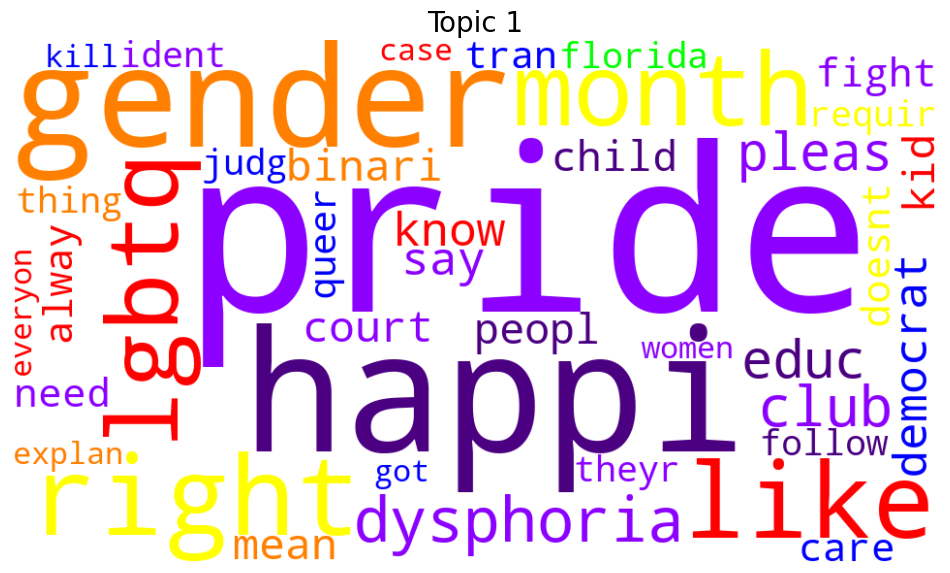

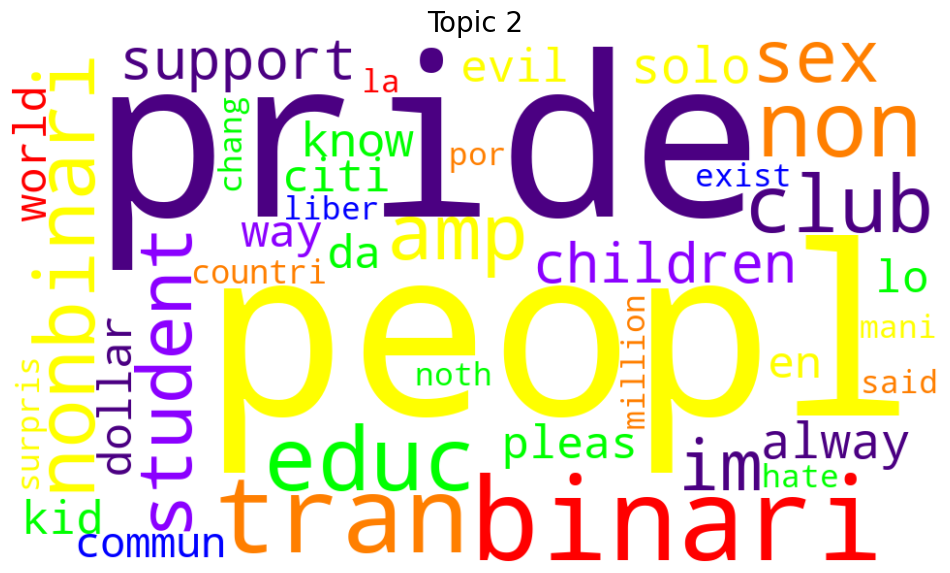

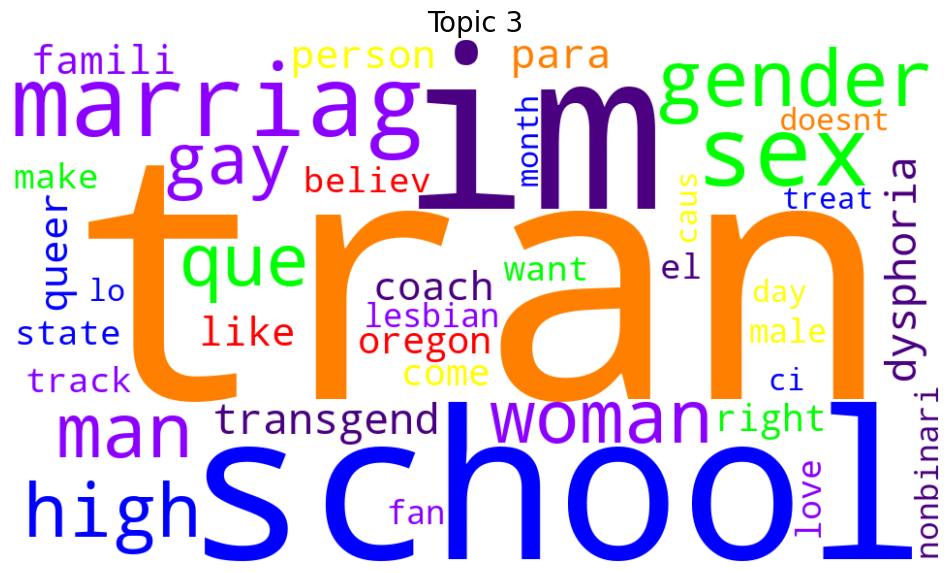

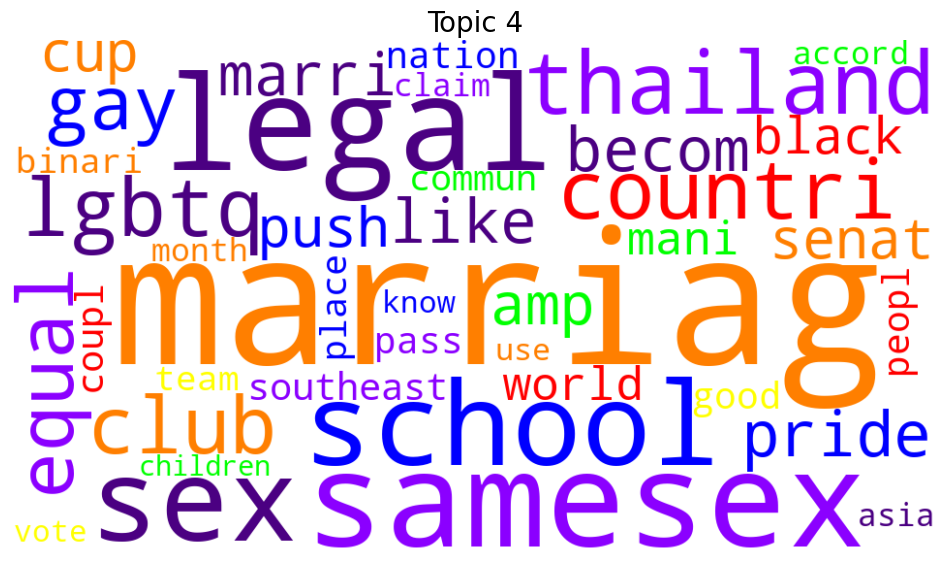

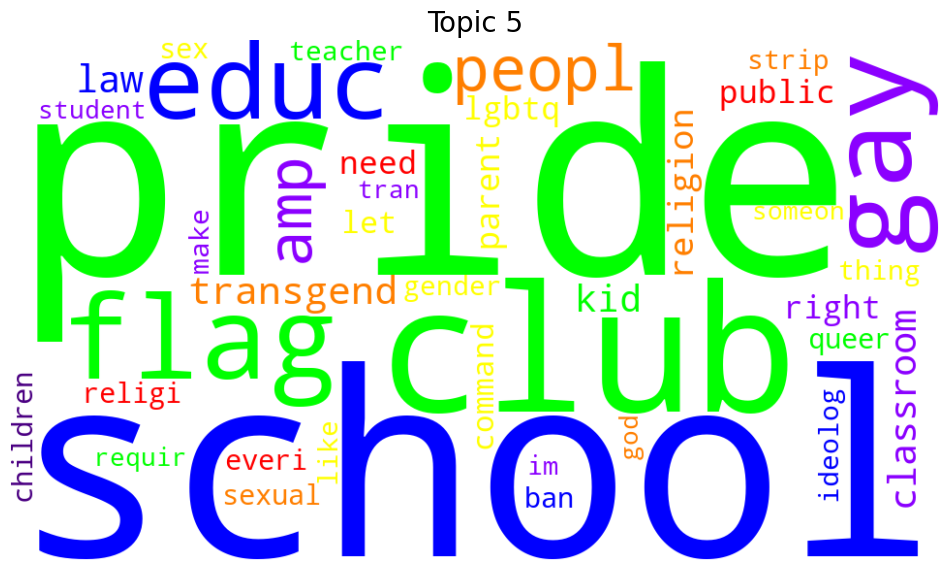

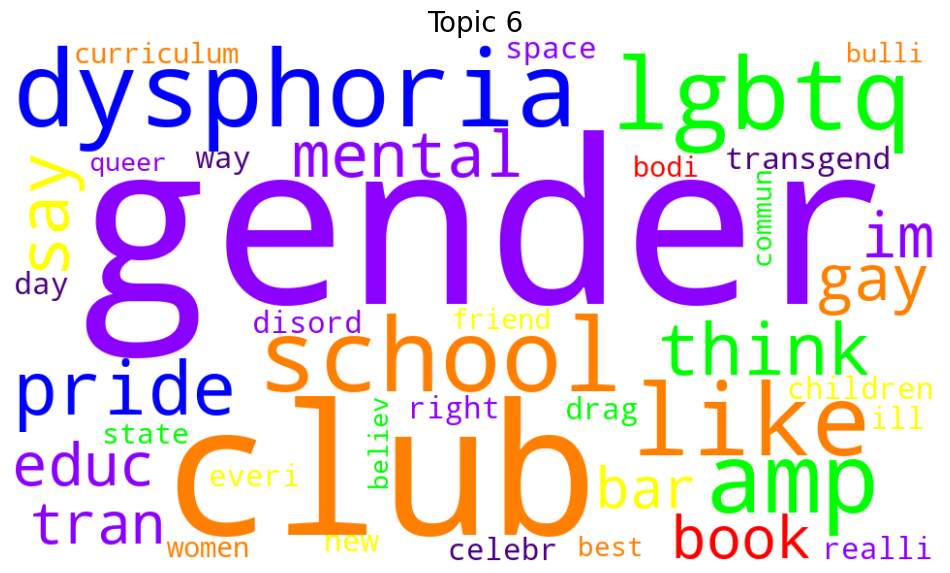

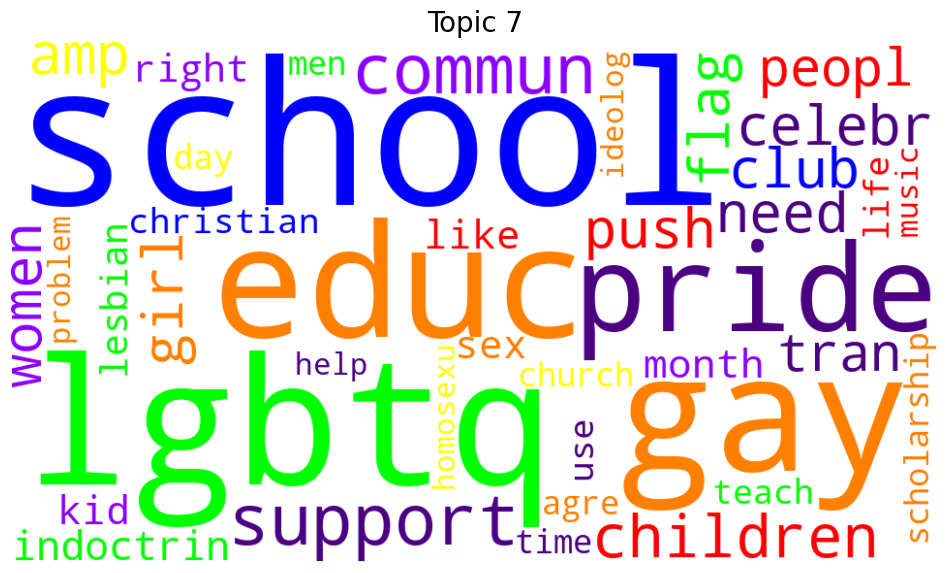

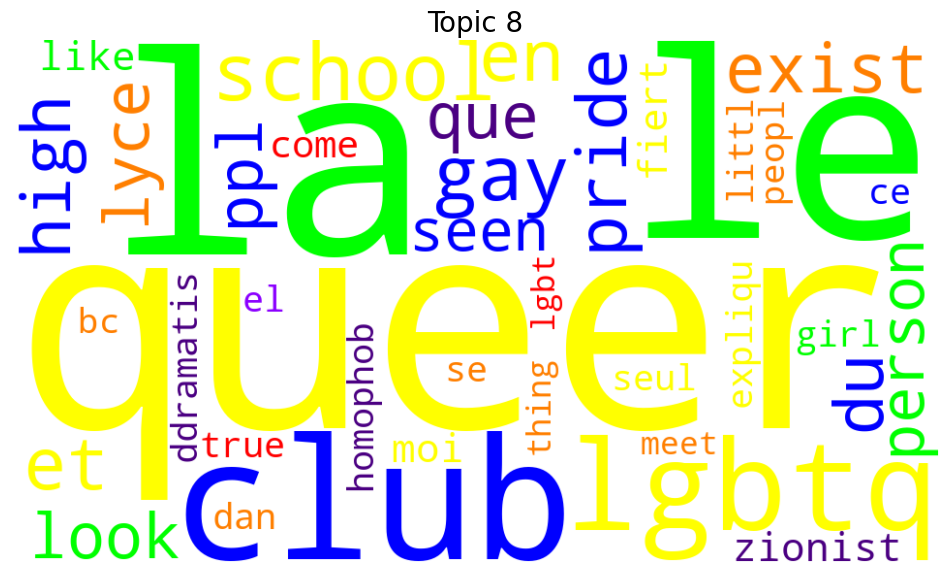

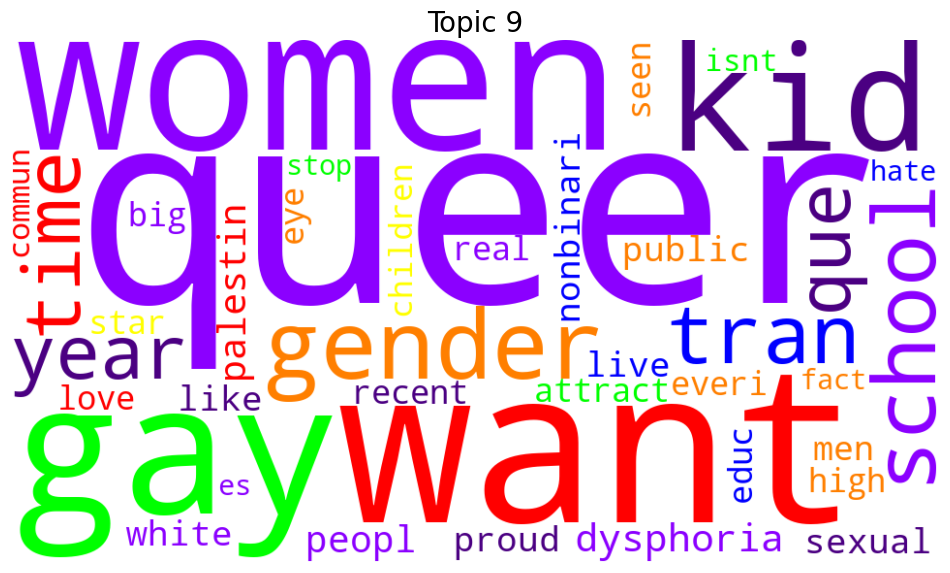

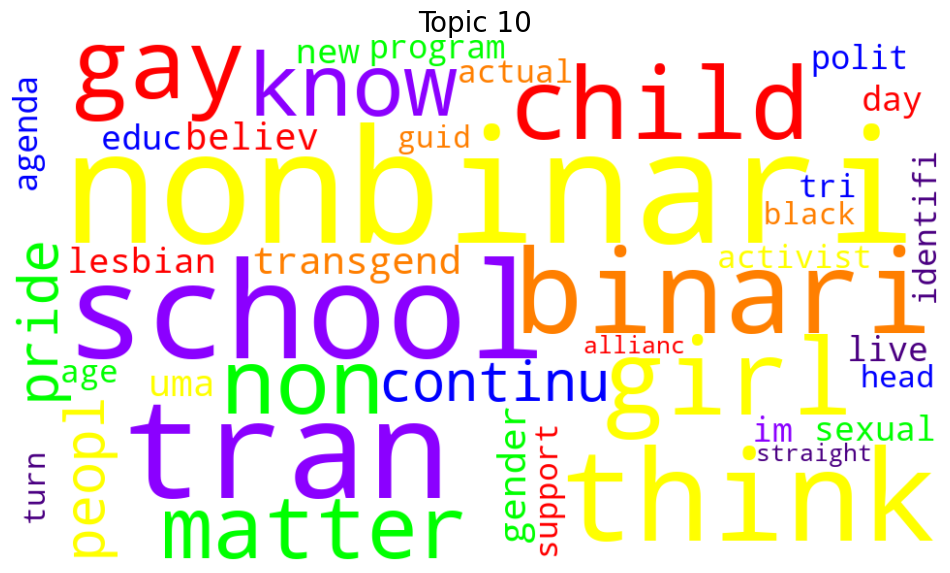

In [42]:


# Preprocess the text data
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess(text):
    # Remove non-alphabetic characters and convert to lowercase
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    # Tokenize
    tokens = text.split()
    # Remove stop words and apply stemming
    tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(tokens)

data['cleaned_text'] = data['cleaned_text'].apply(lambda x: preprocess(str(x)))

# Create a document-term matrix
count_vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = count_vectorizer.fit_transform(data['cleaned_text'])

# Apply LDA to extract topics with 10 topics
lda_model = LatentDirichletAllocation(n_components=10, random_state=42)
lda_model.fit(dtm)

# Function to create a rainbow colormap
def rainbow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    colors = ["#FF0000", "#FF7F00", "#FFFF00", "#00FF00", "#0000FF", "#4B0082", "#8B00FF"]
    return colors[np.random.randint(0, len(colors))]

# Function to display word clouds for each topic with a rainbow color map
def wordcloud_topics(model, features, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540, color_func=rainbow_color_func)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12, 12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic + 1}", fontsize=20)
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic + 1}.png')
        plt.show()

# Call the function to display word clouds for each topic
wordcloud_topics(lda_model, count_vectorizer.get_feature_names_out())



C:\Users\User\AppData\Local\Temp\ipykernel_18200\1598214785.py:4: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


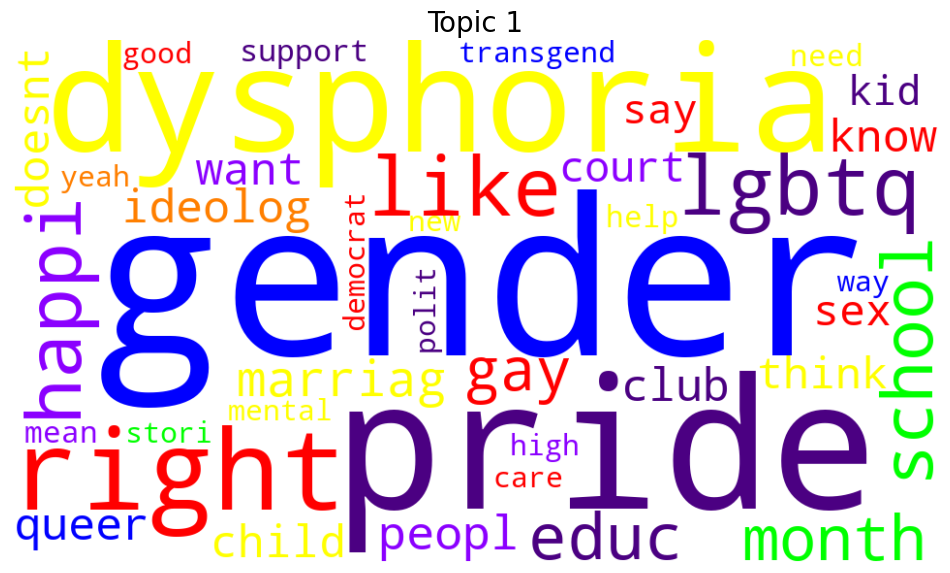

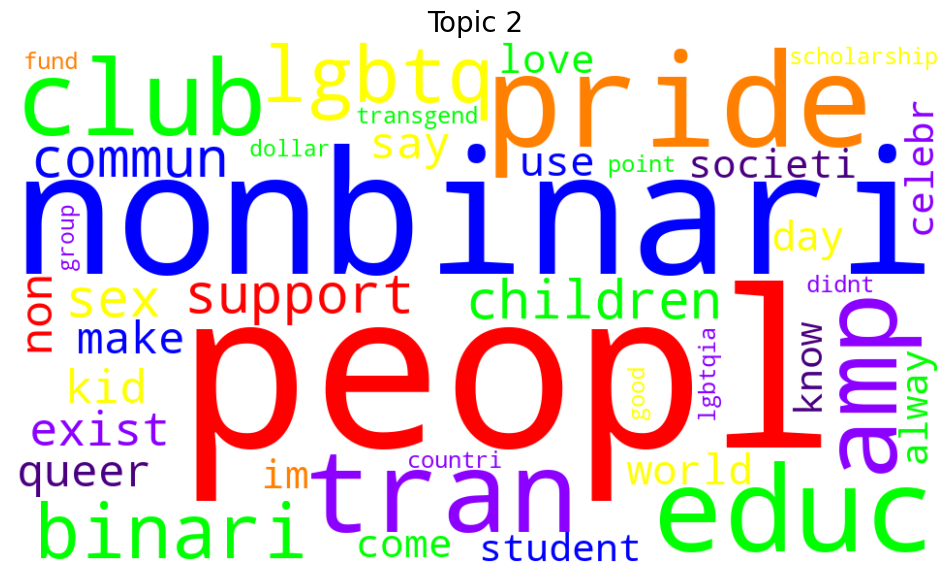

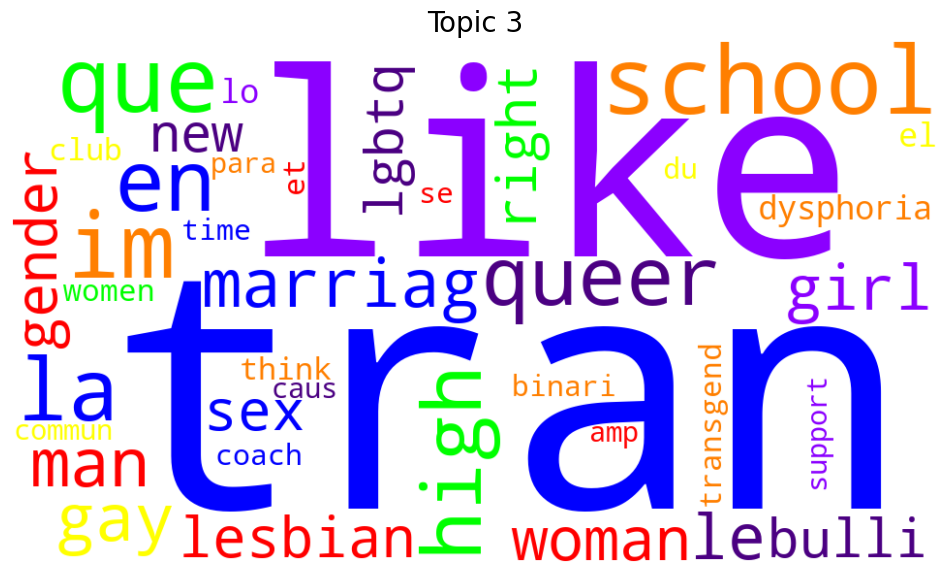

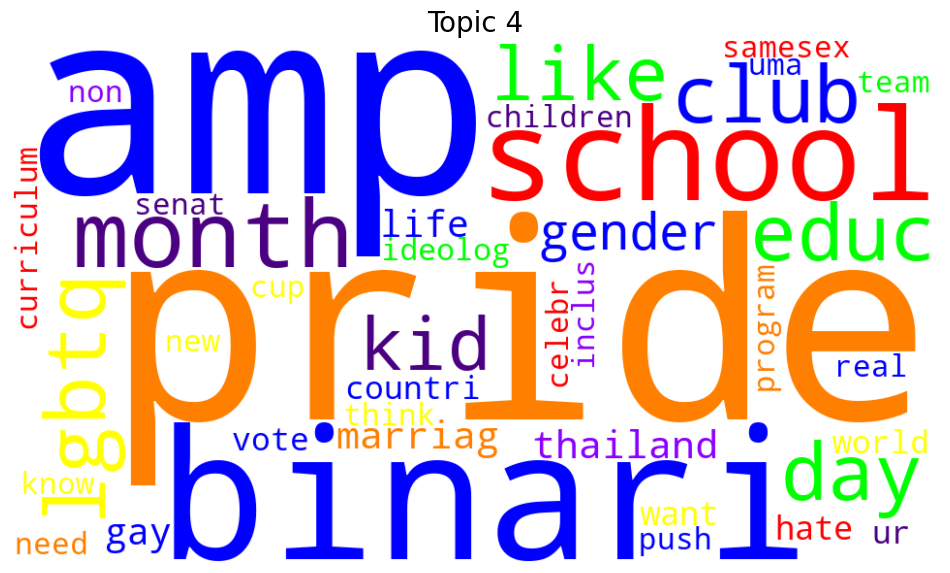

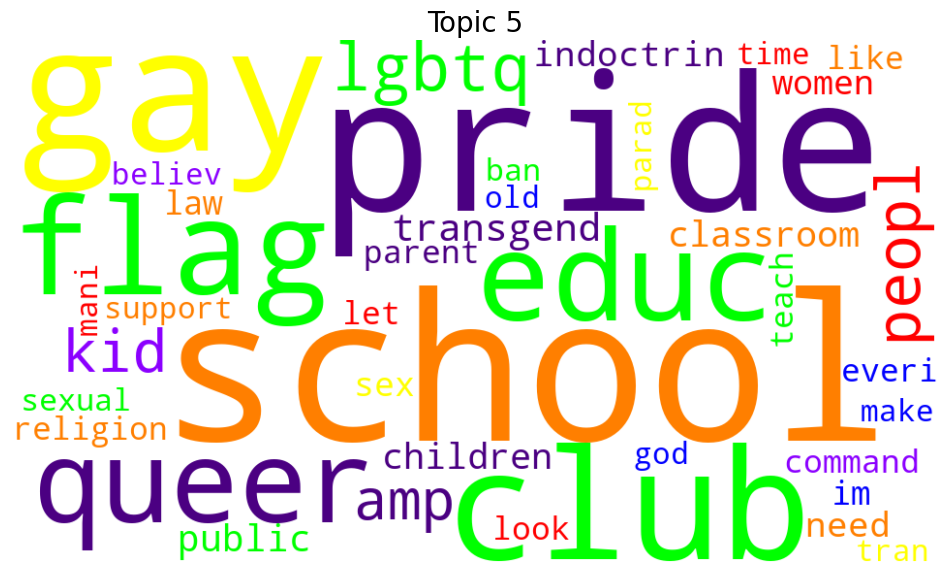

In [53]:
%matplotlib inline
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from IPython.core.display import display, HTML
import pandas as pd
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import numpy as np

# Display settings for Jupyter notebook
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

# Ensure necessary NLTK resources are available
nltk.download('stopwords')

# Load the dataset
data = pd.read_csv('C:/Users/User/Downloads/unique_lgbtq_tweets (2).csv')

# Preprocess the text data
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess(text):
    # Remove non-alphabetic characters and convert to lowercase
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    # Tokenize
    tokens = text.split()
    # Remove stop words and apply stemming
    tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(tokens)

data['cleaned_text'] = data['cleaned_text'].apply(lambda x: preprocess(str(x)))

# Create a document-term matrix
count_vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = count_vectorizer.fit_transform(data['cleaned_text'])

# Apply LDA to extract topics
lda_model = LatentDirichletAllocation(n_components=5, random_state=42)
lda_model.fit(dtm)

# Function to create a rainbow colormap
def rainbow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    colors = ["#FF0000", "#FF7F00", "#FFFF00", "#00FF00", "#0000FF", "#4B0082", "#8B00FF"]
    return colors[np.random.randint(0, len(colors))]

# Function to display word clouds for each topic with a rainbow color map
def wordcloud_topics(model, features, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540, color_func=rainbow_color_func)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12, 12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic + 1}", fontsize=20)
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic + 1}.png')
        plt.show()

# Call the function to display word clouds for each topic
wordcloud_topics(lda_model, count_vectorizer.get_feature_names_out())
